# <font color = blue> <center> COVID-19 Survival Rate Prediction and Analysis Using Medical History of Patients in the US



Prepared by: Nisha Mundanthara Suresh Babu


In [18]:

import pandas as pd
from matplotlib import pyplot as mpl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
%matplotlib inline
# now import stats from scipy
from scipy import stats 
from sklearn.preprocessing import StandardScaler as ss
from sklearn.metrics import silhouette_samples,silhouette_score
from sklearn.cluster import KMeans
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from sklearn.ensemble import RandomForestClassifier
import mglearn
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import DecisionTreeRegressor
from sklearn.model_selection import train_test_split
import nltk
from sklearn.feature_extraction.text import CountVectorizer
from sklearn import metrics
import plotly.express as px  # for data visualization
import plotly.graph_objects as go # for data visualization
#import graphviz # for plotting decision tree graphs
import nltk
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.cluster import DBSCAN
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
import folium
import folium.plugins as plugins
from folium.plugins import HeatMap

## <font color = blue>Introduction

<font color = blue> Globally as of March 14, 2022 almost 456,797,217 confirmed cases of COVID-19, including 6,043,094 deaths have been reported to WHO (https://covid19.who.int/). Strict policies and proper vaccination all over the world lead to a decrease in the covid death rate. But the scarcity of hospital admission is the major problem world addressing now. According to the Center for Disease Control and Prevention people with certain medical conditions are more likely to get very sick with COVID-19 (https://www.cdc.gov/coronavirus/2019-ncov/need-extra-precautions/people-with-medical-conditions.html). So, in order to reduce the death rate, we can prioritize the patients with their medical history and give extra care for the high priority patients.


## <font color = blue>Aim

<font color = blue> The overall purpose of this CW is to analyze the COVID survival rate in US states and find out which medical conditions are influencing the covid death rate. To achieve this the following questions are addressed:
1.	How the states in US can be categorized depends on the medical history of the people.
2.	Predict the Covid Survival rate using the medical history of people.  

## <font color = blue>Task1 

### <font color = blue> Exploratory Data Analysis

#### <font color = blue>Data Collection

<font color = blue>This course work uses symptoms dataset created by Carnegie Mellon University (CMU) and the University of Maryland (UMD) and deaths and cases datasets by Johns Hopkins University. I have selected US data. The data is from Apr. 12, ’20 to Jan. 4, ’21

In [19]:
#read the symptomps dataset
symptoms = pd.read_csv('overall-state-smoothed.csv')

In [20]:
#View the first 10 rows of the dataset
symptoms.head(5)

,date,state_code,gender,age_bucket,summed_n,smoothed_pct_cli,smoothed_pct_ili,smoothed_pct_cli_anosmia_ageusia,smoothed_pct_hh_cli,smoothed_pct_cmnty_cli,...,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_no_above_medical_conditions_weighted,smoothed_pct_multiple_medical_conditions_weighted
0,04/01/2021,ak,female,18-34,142,2.8169,2.8169,4.2254,1.4085,27.1315,...,0.0,2.7010,0.8389,4.3270,22.5092,0.6342,1.9662,7.1869,62.5269,12.3412
1,03/01/2021,ak,female,18-34,130,3.0769,3.0769,4.6154,1.5385,28.3173,...,0.0,3.6825,0.0000,2.2144,20.0254,0.6928,2.1477,7.5217,68.8700,12.2354
2,02/01/2021,ak,female,18-34,116,3.4483,3.4483,4.3103,2.5862,30.3150,...,0.0,1.4763,0.0000,2.5365,19.5448,0.0000,2.4069,7.0974,72.1435,9.6518
3,01/01/2021,ak,female,18-34,119,3.3613,3.3613,4.2017,2.5210,31.5408,...,0.0,2.2748,0.9303,3.3082,25.2423,0.0000,2.4872,7.9263,65.4238,12.7902
4,31/12/2020,ak,female,18-34,113,1.7699,1.7699,1.7699,0.8850,27.2736,...,0.0,1.7223,0.9797,5.2842,25.1198,0.0000,0.8800,6.5537,64.5296,12.9009


In [21]:
symptoms.describe()

,summed_n,smoothed_pct_cli,smoothed_pct_ili,smoothed_pct_cli_anosmia_ageusia,smoothed_pct_hh_cli,smoothed_pct_cmnty_cli,smoothed_pct_worried_finances,smoothed_pct_hh_fever,smoothed_pct_hh_sore_throat,smoothed_pct_hh_cough,...,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_no_above_medical_conditions_weighted,smoothed_pct_multiple_medical_conditions_weighted
count,162691.000000,162684.000000,162684.000000,162684.000000,162691.000000,157147.000000,67685.000000,162691.000000,162691.000000,162691.000000,...,162691.000000,162691.000000,162691.000000,162691.000000,162691.000000,162691.000000,162691.000000,162691.000000,162691.000000,162691.000000
mean,2195.421652,0.784899,0.814034,2.096400,1.227261,18.914424,44.451568,1.573737,7.176515,14.282000,...,6.434151,4.858380,5.903067,29.170485,15.233042,4.210500,2.294725,6.469938,49.367227,22.105711
std,3235.769956,0.629500,0.652508,1.388728,0.851560,9.908060,9.268895,0.959827,3.258634,4.441057,...,7.555674,3.837255,5.196297,15.327622,4.022004,3.513279,1.674965,3.270697,14.656761,12.417121
min,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14.893600,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.646500,0.000000,0.000000,0.000000,9.308200,0.000000
25%,473.000000,0.371700,0.386900,1.180375,0.664500,11.354000,37.589600,0.929500,4.762200,11.022500,...,0.000000,1.361350,1.639800,16.982600,12.333150,1.055400,0.950650,3.757250,37.951750,12.219900
50%,1126.000000,0.639300,0.662100,1.737100,1.024400,16.768100,44.642900,1.366300,6.635100,13.612100,...,2.492300,4.188100,4.350000,28.792300,15.288300,3.555500,1.991100,6.148300,49.834100,20.983600
75%,2530.000000,1.043300,1.079700,2.633825,1.585100,24.436900,51.181100,2.010100,9.023350,16.887500,...,11.721300,7.225750,8.807650,40.431800,17.992500,6.490200,3.228100,8.928250,60.262100,31.259850
max,45877.000000,8.064500,8.064500,17.894700,11.666700,69.116800,75.151500,11.666700,31.168800,41.071400,...,34.933300,27.721600,27.693200,70.686900,40.525500,20.871000,15.634700,30.138700,87.876500,58.631300


In [22]:
#read the deaths dataset
deaths_org = pd.read_csv('deaths_US.csv')
deaths_org.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3342 entries, 0 to 3341
Columns: 545 entries, UID to 07/07/2021
dtypes: float64(3), int64(536), object(6)
memory usage: 13.9+ MB


In [23]:
#read the Case dataset
cases_org = pd.read_csv('confirmed_US.csv')
cases_org.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3342 entries, 0 to 3341
Columns: 544 entries, UID to 07/07/2021
dtypes: float64(3), int64(535), object(6)
memory usage: 13.9+ MB


#### <font color = blue> Data Cleaning

<font color = blue> Gender column has three categories namely male, female and overall. Since overall is the sum of all genders the presence of male and female data separately may cause data inconsistency, hence removed from the study. The same is true for age_bucket column as well, thus retained the overall data only. 

In [24]:
#Take only overall data from gender and age_bucket
symptoms_cleaned=symptoms[symptoms['gender']=='overall']
symptoms_cleaned=symptoms_cleaned[symptoms['age_bucket']=='overall']
symptoms_cleaned.reset_index()
symptoms_cleaned.head()

<ipython-input-24-3e5cd8440355>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  symptoms_cleaned=symptoms_cleaned[symptoms['age_bucket']=='overall']


,date,state_code,gender,age_bucket,summed_n,smoothed_pct_cli,smoothed_pct_ili,smoothed_pct_cli_anosmia_ageusia,smoothed_pct_hh_cli,smoothed_pct_cmnty_cli,...,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_no_above_medical_conditions_weighted,smoothed_pct_multiple_medical_conditions_weighted
2843,04/01/2021,ak,overall,overall,863,0.5822,0.6981,2.4422,0.9280,24.5653,...,0.0,5.8207,4.3778,27.8357,14.5852,4.1192,2.5191,6.6227,50.1573,22.8766
2844,03/01/2021,ak,overall,overall,840,0.7172,0.8363,2.7471,1.1944,25.2787,...,0.0,6.0032,4.7355,28.4831,14.0691,4.1453,2.5807,7.4943,49.7300,24.0246
2845,02/01/2021,ak,overall,overall,836,0.8421,0.9617,2.6425,1.3198,25.2179,...,0.0,6.3341,4.8303,29.6671,14.0919,4.2002,3.0480,7.3390,50.2706,23.7413
2846,01/01/2021,ak,overall,overall,843,0.8351,0.9537,2.5019,1.3088,24.2887,...,0.0,6.1784,4.8068,30.6982,15.4958,4.1209,2.6179,7.7438,48.2920,25.0302
2847,31/12/2020,ak,overall,overall,823,0.7357,0.8572,2.1995,1.3406,23.1000,...,0.0,6.0450,5.5761,29.9911,16.1019,4.3086,2.5463,7.7253,48.3343,25.3286


### <font color = blue> Feature Engineering

 <font color = blue>Feature Engineering is used to modify or create features needed for our analysis.

The State_code column is mapped to the State names and created a new column Province_State. I have merged cases and death datasets, and selected province_state and the cumulative value of deaths and cases on Jan 4 2021 since this is the last recorded date in symptoms dataset. 




In [25]:
#Abbrevations to the state code
us_state_abbrev = {
            'al': 'Alabama',
            'ak': 'Alaska',
            'az': 'Arizona',
            'ar': 'Arkansas',
            'ca': 'California',
            'co': 'Colorado',
            'ct': 'Connecticut',
            'de': 'Delaware',
            'fl': 'Florida',
            'ga': 'Georgia',
            'hi': 'Hawaii',
            'id': 'Idaho',
            'il': 'Illinois',
            'in': 'Indiana',
            'ia': 'Iowa',
            'ks': 'Kansas',
            'ky': 'Kentucky',
            'la': 'Louisiana',
            'me': 'Maine',
            'md': 'Maryland',
            'ma': 'Massachusetts',
            'mi': 'Michigan',
            'mn': 'Minnesota',
            'ms': 'Mississippi',
            'mo': 'Missouri',
            'mt': 'Montana',
            'ne': 'Nebraska',
            'nv': 'Nevada',
            'nh': 'New Hampshire',
            'nj': 'New Jersey',
            'nm': 'New Mexico',
            'ny': 'New York',
            'nc': 'North Carolina',
            'nd': 'North Dakota',
            'oh': 'Ohio',
            'ok': 'Oklahoma',
            'or': 'Oregon',
            'pa': 'Pennsylvania',
            'ri': 'Rhode Island',
            'sc': 'South Carolina',
            'sd': 'South Dakota',
            'tn': 'Tennessee',
            'tx': 'Texas',
            'ut': 'Utah',
            'vt': 'Vermont',
            'va': 'Virginia',
            'wa': 'Washington',
            'wv': 'West Virginia',
            'wi': 'Wisconsin',
            'wy': 'Wyoming',
            'dc': 'District of Columbia',
            'pr': 'Puerto Rico'
            
        }


In [26]:
#Add a new column with the State abbrevations
symptoms_cleaned['Province_State'] = symptoms_cleaned['state_code'].map(us_state_abbrev)
symptoms.head(10)

,date,state_code,gender,age_bucket,summed_n,smoothed_pct_cli,smoothed_pct_ili,smoothed_pct_cli_anosmia_ageusia,smoothed_pct_hh_cli,smoothed_pct_cmnty_cli,...,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_no_above_medical_conditions_weighted,smoothed_pct_multiple_medical_conditions_weighted
0,04/01/2021,ak,female,18-34,142,2.8169,2.8169,4.2254,1.4085,27.1315,...,0.0,2.7010,0.8389,4.3270,22.5092,0.6342,1.9662,7.1869,62.5269,12.3412
1,03/01/2021,ak,female,18-34,130,3.0769,3.0769,4.6154,1.5385,28.3173,...,0.0,3.6825,0.0000,2.2144,20.0254,0.6928,2.1477,7.5217,68.8700,12.2354
2,02/01/2021,ak,female,18-34,116,3.4483,3.4483,4.3103,2.5862,30.3150,...,0.0,1.4763,0.0000,2.5365,19.5448,0.0000,2.4069,7.0974,72.1435,9.6518
3,01/01/2021,ak,female,18-34,119,3.3613,3.3613,4.2017,2.5210,31.5408,...,0.0,2.2748,0.9303,3.3082,25.2423,0.0000,2.4872,7.9263,65.4238,12.7902
4,31/12/2020,ak,female,18-34,113,1.7699,1.7699,1.7699,0.8850,27.2736,...,0.0,1.7223,0.9797,5.2842,25.1198,0.0000,0.8800,6.5537,64.5296,12.9009
5,30/12/2020,ak,female,18-34,114,1.7544,1.7544,2.6316,0.8772,27.6923,...,0.0,1.7072,0.9711,5.8216,23.5239,0.0000,0.8723,5.6568,65.5732,11.8343
6,29/12/2020,ak,female,18-34,118,2.5424,2.5424,3.3898,0.8475,28.7133,...,0.0,1.6493,0.9382,8.3474,25.1627,0.0000,0.8427,6.0939,62.9065,16.0922
7,28/12/2020,ak,female,18-34,119,1.6807,1.6807,3.4080,0.8403,27.6317,...,0.0,1.6354,0.9303,11.0603,27.5926,0.0000,0.8357,5.2715,56.3296,16.5319
8,27/12/2020,ak,female,18-34,125,1.6000,1.6000,3.2444,0.8000,26.4936,...,0.0,0.7955,0.8856,12.1962,31.9625,0.0000,0.7955,4.8938,52.7091,18.2982
9,26/12/2020,ak,female,18-34,122,0.8197,0.8197,2.5046,0.0000,23.6942,...,0.0,0.8151,0.9074,12.2274,31.8434,0.0000,0.8151,2.8171,54.4548,16.1015


<font color = blue> Since the aim of the CW is to analyse the medical history of patients, the features describing percentage of people have been diagnosed with diabetics, cancer, heart disease, high blood pressure, asthma, chronic lung disease, autoimmune disorder, and multiple medical conditions were selected from the symptoms dataset. All the features are smoothed (7-day trailing average) and weighted (to adjust survey bias), their counterparts are removed from the analysis. 

In [27]:
#Select only the medical history of people
sel_symptoms=symptoms_cleaned[['Province_State','smoothed_pct_diabetes_weighted','smoothed_pct_cancer_weighted','smoothed_pct_heart_disease_weighted','smoothed_pct_high_blood_pressure_weighted','smoothed_pct_asthma_weighted','smoothed_pct_chronic_lung_disease_weighted','smoothed_pct_kidney_disease_weighted','smoothed_pct_autoimmune_disorder_weighted','smoothed_pct_multiple_medical_conditions_weighted']].copy()
sel_symptoms.head(10)

,Province_State,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_multiple_medical_conditions_weighted
2843,Alaska,0.0,5.8207,4.3778,27.8357,14.5852,4.1192,2.5191,6.6227,22.8766
2844,Alaska,0.0,6.0032,4.7355,28.4831,14.0691,4.1453,2.5807,7.4943,24.0246
2845,Alaska,0.0,6.3341,4.8303,29.6671,14.0919,4.2002,3.0480,7.3390,23.7413
2846,Alaska,0.0,6.1784,4.8068,30.6982,15.4958,4.1209,2.6179,7.7438,25.0302
2847,Alaska,0.0,6.0450,5.5761,29.9911,16.1019,4.3086,2.5463,7.7253,25.3286
2848,Alaska,0.0,5.7092,5.9611,29.9924,15.1254,3.7399,3.0521,7.1825,24.7661
2849,Alaska,0.0,5.5975,6.3928,31.2528,16.0885,4.0729,2.9960,7.7561,26.2867
2850,Alaska,0.0,5.1600,6.4294,31.7195,16.7143,4.7971,2.9775,7.2535,25.7800
2851,Alaska,0.0,5.1360,6.1395,31.7069,17.9009,4.3855,2.5923,6.9655,25.3440
2852,Alaska,0.0,4.6570,6.3975,31.9220,17.5813,4.1085,2.2860,6.4576,25.5940


#### <font color = blue> Missing Values

<font color = blue>  Since we have selected the features we needed we can check if there is any missing values present in the columns. Fortunately our data is very clean and there are no missing values. There are no missing values in the case and death dataswts as well. 

In [28]:
sel_symptoms.isnull().sum()

Province_State                                       0
smoothed_pct_diabetes_weighted                       0
smoothed_pct_cancer_weighted                         0
smoothed_pct_heart_disease_weighted                  0
smoothed_pct_high_blood_pressure_weighted            0
smoothed_pct_asthma_weighted                         0
smoothed_pct_chronic_lung_disease_weighted           0
smoothed_pct_kidney_disease_weighted                 0
smoothed_pct_autoimmune_disorder_weighted            0
smoothed_pct_multiple_medical_conditions_weighted    0
dtype: int64

In [29]:
#Group the columns to get state aggregates of each columns.
sel_symptoms = sel_symptoms.groupby('Province_State',as_index=False).mean()
sel_symptoms.head(10)

,Province_State,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_multiple_medical_conditions_weighted
0,Alabama,8.080230,5.114402,7.854010,37.227428,13.488064,5.364038,2.612483,7.276261,26.921051
1,Alaska,5.477373,4.742895,5.269252,28.281193,15.634931,3.430474,2.019692,6.772147,20.922237
2,Arizona,6.687863,5.678455,6.304627,29.519569,15.752983,4.378867,3.187622,6.800767,23.806747
3,Arkansas,7.998405,5.384112,8.466728,37.186986,13.873276,6.457294,2.545538,7.334030,27.614484
4,California,6.050766,4.457479,4.526817,25.580122,15.141663,3.013199,2.098551,5.272128,19.659067
5,Colorado,4.667150,4.628336,4.549158,23.083032,15.902380,3.518842,1.953609,6.318754,18.214875
6,Connecticut,5.995150,5.804297,5.880602,29.306854,16.306559,3.719332,2.009965,6.679103,22.285310
7,Delaware,7.184602,6.131877,6.940940,33.661661,15.093449,4.648513,2.740774,6.526231,24.751480
8,District of Columbia,4.133381,4.194638,2.995579,22.610181,15.687734,1.860523,1.751674,4.837319,14.955190
9,Florida,6.986914,6.040425,7.170746,32.528360,12.965170,5.277461,2.803523,6.758952,24.676229


<font color = blue> The average of deaths and cases are calculated and grouped into provinces.

In [30]:
#Select State,population,lat.long and 7/7/2021(cumilative deaths)
deaths_filtered=deaths_org[['Province_State','Lat','Long_','04/01/2021']].copy()
deaths_filtered.isnull().sum()

Province_State    0
Lat               0
Long_             0
04/01/2021        0
dtype: int64

In [31]:
#Select State and 7/7/2021(cumilative cases)
cases_filtered=cases_org[['Province_State','04/01/2021']].copy()
cases_filtered.isnull().sum()

Province_State    0
04/01/2021        0
dtype: int64

In [32]:
#Merge deaths and cases
death_case_merged=pd.merge(cases_filtered,deaths_filtered,on='Province_State')


death_case_merged.describe()

,04/01/2021_x,Lat,Long_,04/01/2021_y
count,3.232340e+05,323234.000000,323234.000000,323234.000000
mean,8.416331e+03,35.836759,-89.234748,147.843955
std,3.108011e+04,7.628592,16.796618,569.036141
min,0.000000e+00,-14.271000,-174.159600,0.000000
25%,8.650000e+02,32.674356,-97.649253,17.000000
50%,2.101000e+03,36.685424,-90.538709,43.000000
75%,5.314000e+03,40.157180,-83.475500,99.000000
max,1.220256e+06,69.314792,145.673900,23191.000000


In [33]:
#Rename the columns to get meaningful names
death_case_merged.rename(columns={'Long_':'Long','04/01/2021_x':'Cases','04/01/2021_y':'Deaths'},inplace=True)
death_case_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 323234 entries, 0 to 323233
Data columns (total 5 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   Province_State  323234 non-null  object 
 1   Cases           323234 non-null  int64  
 2   Lat             323234 non-null  float64
 3   Long            323234 non-null  float64
 4   Deaths          323234 non-null  int64  
dtypes: float64(2), int64(2), object(1)
memory usage: 14.8+ MB


In [34]:
death_case_group = death_case_merged.groupby('Province_State',as_index=False).mean()
death_case_group = death_case_group.drop(['Lat','Long'],axis=1)
death_case_group['Cases'] = death_case_group['Cases'].astype(int)
death_case_group['Deaths'] = death_case_group['Deaths'].astype(int)
#death_case_group


 <font color = blue> A new column Case Fatality Rate (CFR) is calculated as Deaths/Cases*100. This is the target feature. A CFR is the number of deaths among the number of diagnosed cases, regardless of time or total population. A high CFR indicates a low survival rate and a low CFR indicates a high survival rate.


We can observe one NaN value for American Samoa and negligible values for Diamond princess, Grand Princess, etc. But these states are not recorded in symptoms dataset and it will be removed when combining both. So we don’t have to worry about these outlier values.

In [38]:
death_case_group['Case_Fatality_Rate']=round(death_case_group.Deaths/death_case_group.Cases*100,2)
#death_case_group.head(5)

In [39]:
death_case_group.isnull().sum()

Province_State        0
Cases                 0
Deaths                0
Case_Fatality_Rate    1
dtype: int64

<font color = blue> The symptoms data set is grouped into different states and merged with the case and death dataset. So the resulting data now consists of medical history plus number of positive cases, deaths and Case_Fatality Rate. 



In [43]:
covid=pd.merge(sel_symptoms,death_case_group,on='Province_State')
covid.isnull().sum()

Province_State                                       0
smoothed_pct_diabetes_weighted                       0
smoothed_pct_cancer_weighted                         0
smoothed_pct_heart_disease_weighted                  0
smoothed_pct_high_blood_pressure_weighted            0
smoothed_pct_asthma_weighted                         0
smoothed_pct_chronic_lung_disease_weighted           0
smoothed_pct_kidney_disease_weighted                 0
smoothed_pct_autoimmune_disorder_weighted            0
smoothed_pct_multiple_medical_conditions_weighted    0
Cases                                                0
Deaths                                               0
Case_Fatality_Rate                                   0
dtype: int64

<font color = blue> The columns Cases and Deaths are dropped from the final data frame since thery are no use in the modelling.

In [44]:
covid=covid.drop(['Cases','Deaths'],axis=1)


### <font color = blue>Visualizations

<font color = blue> A folium map of US with death density is shown above. Texas is the state with highest number of deaths followed by California and Georgia.

In [45]:
#Death density map of US

#dependencies: folium,folium plugins, HeatMap

density=folium.Map(location=[37.0902,-95.7129],zoom_start=4)


heat_df =  death_case_merged[['Lat','Long','Deaths']].copy()

heat_data = [[row['Lat'],row['Long']] for index, row in heat_df.iterrows()]

HeatMap(heat_data).add_to(density)

density

<font color = blue> Top 10 high CFR states and top 10 low Case Fatality Rate(CFR) states bar charts are shown below. Graand Princess, Massachusetts, New Jersy are the top3 states with high CFR wheras Diamond Princess, Alaska, Utah are the top3 staes with low CFR.(American Samoa is not listed here since it didn't have any cases or deaths reported at that time)

<AxesSubplot:xlabel='Province_State'>

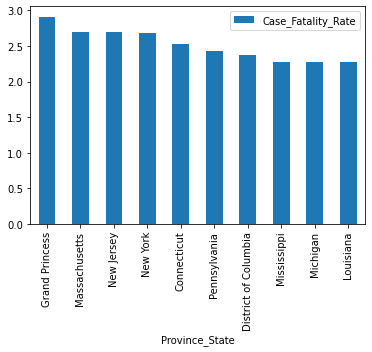

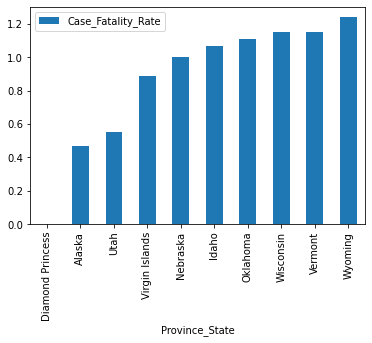

In [46]:
#States with higher CFR
death_case_group.sort_values(by='Case_Fatality_Rate',ascending=False)[:10].plot(x="Province_State", y="Case_Fatality_Rate", kind="bar")
#States with lower CFR
death_case_group.sort_values(by='Case_Fatality_Rate',ascending=True)[:10].plot(x="Province_State", y="Case_Fatality_Rate", kind="bar")

### <font color = blue>Data Transformations

<font color = blue> Model with skewed data doesn’t work properly, so the features are checked for skewness. Some fields are over skewed and transformed using log10 method. For example, smoothed_pct_diabetics_weighted field is highly left-skewed, the reason for this may be it is very common in older people than in youth and may cause a abnormal distribution. After log transformation, it shows a normal distribution.



In [47]:
covid.skew(axis = 0, skipna = True)

smoothed_pct_diabetes_weighted                       0.855026
smoothed_pct_cancer_weighted                        -0.504944
smoothed_pct_heart_disease_weighted                 -0.220951
smoothed_pct_high_blood_pressure_weighted            0.347224
smoothed_pct_asthma_weighted                        -0.007413
smoothed_pct_chronic_lung_disease_weighted           0.211867
smoothed_pct_kidney_disease_weighted                 0.606273
smoothed_pct_autoimmune_disorder_weighted           -0.367128
smoothed_pct_multiple_medical_conditions_weighted   -0.036236
Case_Fatality_Rate                                   0.078195
dtype: float64

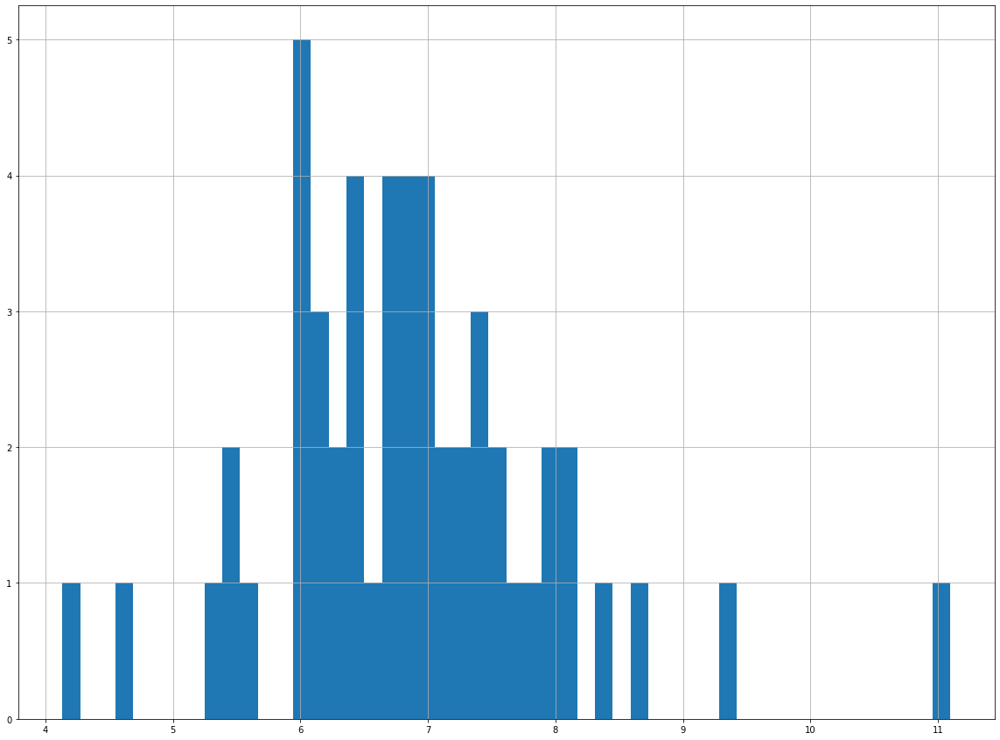

In [48]:
covid['smoothed_pct_diabetes_weighted'].hist(bins = 50, figsize=(20,15))
#np.log10(covid['smoothed_pct_diabetes_weighted']).hist(bins = 50, figsize=(20,15))
mpl.show()

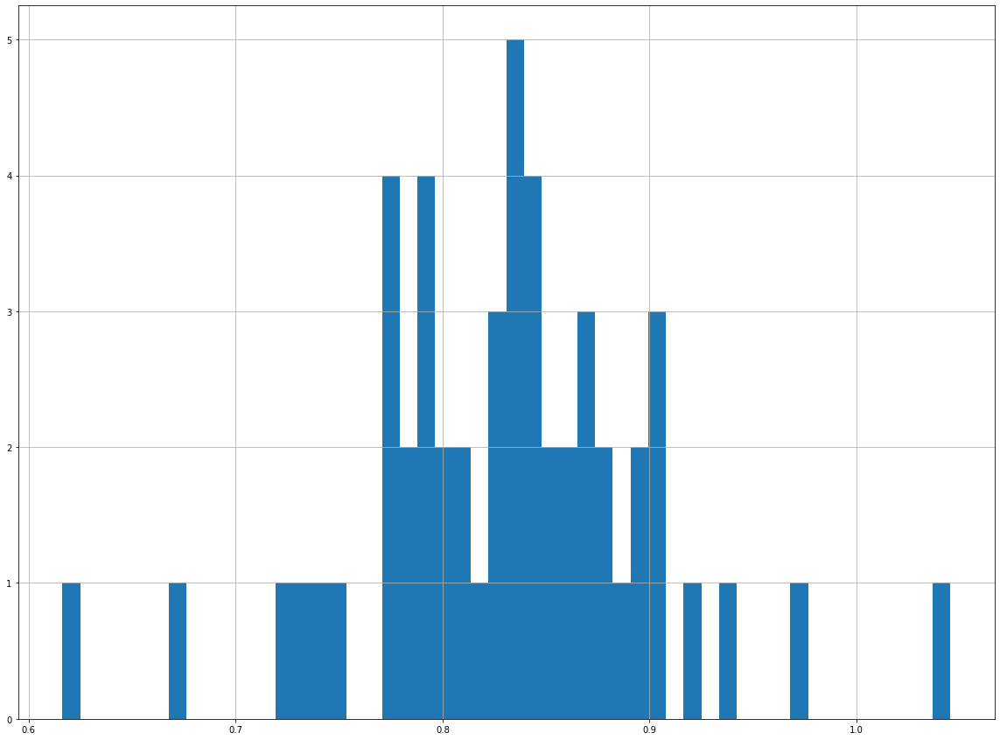

In [49]:
np.log10(covid['smoothed_pct_diabetes_weighted']).hist(bins = 50, figsize=(20,15))
mpl.show()

In [50]:
covid_skew=covid.copy()
covid_skew['smoothed_pct_diabetes_weighted']=np.log10(covid.smoothed_pct_diabetes_weighted)
#covid_skew['smoothed_pct_cancer_weighted']=np.log10(covid.smoothed_pct_cancer_weighted)
#covid_skew['smoothed_pct_heart_disease_weighted']=np.log10(covid.smoothed_pct_heart_disease_weighted)
#covid_skew['smoothed_pct_autoimmune_disorder_weighted']=np.log10(covid.smoothed_pct_autoimmune_disorder_weighted)
#covid_skew['smoothed_pct_multiple_medical_conditions_weighted']=np.log10(covid.smoothed_pct_multiple_medical_conditions_weighted)
covid_skew.skew(axis = 0, skipna = True)

smoothed_pct_diabetes_weighted                      -0.096203
smoothed_pct_cancer_weighted                        -0.504944
smoothed_pct_heart_disease_weighted                 -0.220951
smoothed_pct_high_blood_pressure_weighted            0.347224
smoothed_pct_asthma_weighted                        -0.007413
smoothed_pct_chronic_lung_disease_weighted           0.211867
smoothed_pct_kidney_disease_weighted                 0.606273
smoothed_pct_autoimmune_disorder_weighted           -0.367128
smoothed_pct_multiple_medical_conditions_weighted   -0.036236
Case_Fatality_Rate                                   0.078195
dtype: float64

### <font color = blue> Scaling

<font color = blue> Since all the columns except target are in same measures we don’t have to scale the dataframe.

### <font color = blue>Outliers

<font color = blue> The presence of outliers was also checked. No further action has been taken since no or minimal outliers are present in the columns.

C:\Users\Nisha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Nisha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Nisha\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\Nisha\anaconda3\lib\si

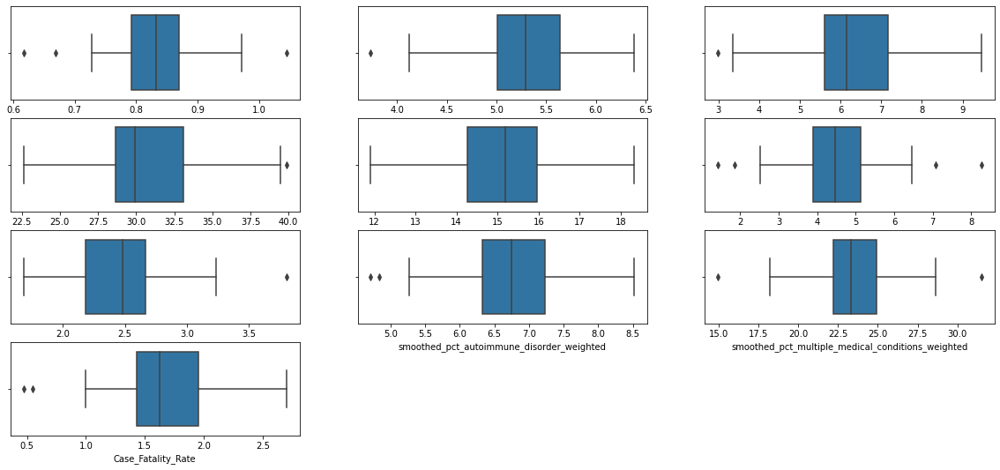

In [51]:
plt.figure(figsize=(20, 30))
for i in range(1, len(covid_skew.columns)):
  plt.subplot(13, 3, i)
  sns.boxplot(covid_skew.columns[i], data=covid_skew)

### <font color = blue> Correlation Analysis

<font color = blue> Correlation analysis can help us to know what relationship each column has. The results show that there are many correlation values in the columns which indicate a strong relationship, both positive and negative. For example, the correlation between diabetics and high blood pressure has a strong positive relationship. Highly correlated predictors are not good, so we have to address this issue when using ML algorithms. Correlation between predictors and targets is a good sign. Surprisingly our predictors only show a mild correlation with the target feature. This might affect the accuracy of our model.

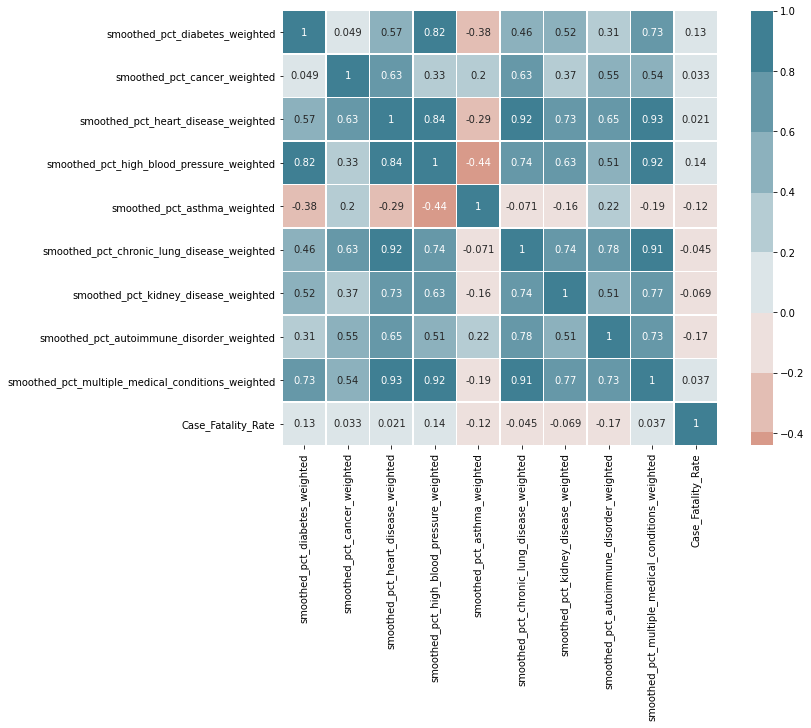

In [52]:
corr = covid_skew.corr()
plt.figure(figsize=(12,8))
cor_mat = sns.heatmap(
    corr,
    center = 0,
    cmap = sns.diverging_palette(20,220, n = 10),
    square = True,
    annot=True,
    linewidths = 0.5
 )



###  <font color = blue> Summary

In [53]:
covid_final=covid_skew.copy()
#covid_final.info()

<font color = blue> Final dataframe is created by combining symptoms,Cases, and Deaths datasets.The dataframe is checked for null values, outliers and skewness and necessary actions are taken. The final dataframe consists of 11 features inluding the target variable. The target variable is Case_Fatality_Ratio(CFR) and the predictors are percentage of people with certain medical histories. The details of the dataframe is given in Appendix.
    
Correlation analysis is performed to observe the collinearity and serious obsevations are found. There is very little correlation between the target value and predictors. The reason might be the merging of survey data with original death/cases data. This might affect the prediction accuracy of our algorithms.

## <font color = blue> Task 2

<font color = blue>   Aim: 
    
  <font color = blue>  To rank and categorize states in US according to percentage of patient's medical history
    
  

### <font color = blue>K-Means Cluster Analysis

In [65]:
covid_km=covid_final.iloc[:, 1:10]
#covid_km.info()

C:\Users\Nisha\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Initialization complete
Iteration 0, inertia 1634.1901145653958.
Iteration 1, inertia 1454.140350014496.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1817.3190919584679.
Iteration 1, inertia 1454.140350014496.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1767.2471284851665.
Iteration 1, inertia 1454.140350014496.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2249.6042144438447.
Iteration 1, inertia 1454.140350014496.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1737.9698792895126.
Iteration 1, inertia 1454.140350014496.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 2037.0195570168498.
Iteration 1, inertia 1454.140350014496.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 1722.121632444201.
Iteration 1, inertia 1454.1403

Initialization complete
Iteration 0, inertia 314.053377229653
Iteration 1, inertia 275.1944811376034
Iteration 2, inertia 272.5014012414892
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 311.64071043788624
Iteration 1, inertia 255.26693705428326
Iteration 2, inertia 245.03949892906368
Iteration 3, inertia 244.5210356137702
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 382.4359209515553
Iteration 1, inertia 258.60212388113246
Iteration 2, inertia 249.23151380533506
Iteration 3, inertia 247.78185184571365
Iteration 4, inertia 246.62191420076306
Converged at iteration 4: strict convergence.
Initialization complete
Iteration 0, inertia 387.03938369376124
Iteration 1, inertia 264.3967237340359
Iteration 2, inertia 252.5374081284676
Converged at iteration 2: strict convergence.
Initialization complete
Iteration 0, inertia 337.517002652009
Iteration 1, inertia 243.09321084042253
Converged at iteration 1: 

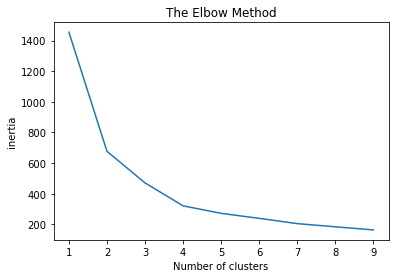

In [66]:
inertia = []
for i in range (1, 10):
  kmeans = KMeans(n_clusters=i, max_iter = 20, verbose = 1, random_state=42)
  kmeans.fit(covid_km)
  inertia.append(kmeans.inertia_)
    
plt.plot(range(1,10), inertia)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('inertia')
plt.show()
#sh

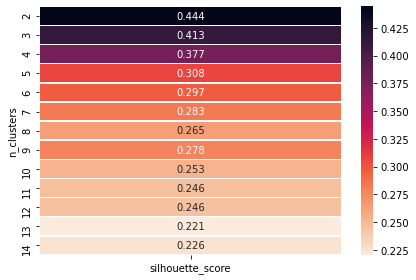

In [67]:
#Performance evaluation
#Silhouette Score
#The Silhouette Score and Silhouette Plot are used to measure the separation distance between clusters.

# Calculate Silhoutte Score
#

clusters_range = range (2,15)
results = []
for i in clusters_range:
  cluster = KMeans(n_clusters=i, init='k-means++', random_state=42)
  cluster_labels= cluster.fit_predict(covid_km)
  silhouette_avg =  silhouette_score(covid_km, cluster_labels)
  results.append([i, silhouette_avg])
result =  pd.DataFrame(results, columns=['n_clusters','silhouette_score'])
pivot = pd.pivot_table(result,index='n_clusters', values='silhouette_score')
plt.figure()
sns.heatmap(pivot, annot=True, linewidths=.5, fmt='.3f', cmap=sns.cm.rocket_r)
plt.tight_layout()




In [58]:
## remove highly correlated predictors

covid_km1=covid_final.iloc[:, [1,2,3,5,7,8]]
covid_km1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 0 to 51
Data columns (total 6 columns):
 #   Column                                     Non-Null Count  Dtype  
---  ------                                     --------------  -----  
 0   smoothed_pct_diabetes_weighted             52 non-null     float64
 1   smoothed_pct_cancer_weighted               52 non-null     float64
 2   smoothed_pct_heart_disease_weighted        52 non-null     float64
 3   smoothed_pct_asthma_weighted               52 non-null     float64
 4   smoothed_pct_kidney_disease_weighted       52 non-null     float64
 5   smoothed_pct_autoimmune_disorder_weighted  52 non-null     float64
dtypes: float64(6)
memory usage: 2.8 KB


C:\Users\Nisha\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.
  warnings.warn(


Initialization complete
Iteration 0, inertia 300.9629061251661.
Iteration 1, inertia 239.448429057419.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 288.6884512352642.
Iteration 1, inertia 239.448429057419.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 301.64679504651076.
Iteration 1, inertia 239.448429057419.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 289.6714479336776.
Iteration 1, inertia 239.448429057419.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 516.2430885489723.
Iteration 1, inertia 239.448429057419.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 307.4133538962794.
Iteration 1, inertia 239.448429057419.
Converged at iteration 1: strict convergence.
Initialization complete
Iteration 0, inertia 335.8149205154152.
Iteration 1, inertia 239.448429057419.
Co

Initialization complete
Iteration 0, inertia 102.90701074508138
Iteration 1, inertia 73.38005627256254
Iteration 2, inertia 68.17726441339828
Iteration 3, inertia 67.04400566652023
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 113.08420044711796
Iteration 1, inertia 70.3497526831902
Iteration 2, inertia 67.3337477666279
Iteration 3, inertia 66.93229156479593
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 85.88980160319291
Iteration 1, inertia 66.91300289506619
Iteration 2, inertia 64.88675992849402
Iteration 3, inertia 63.62633048939671
Iteration 4, inertia 62.87664351239668
Iteration 5, inertia 60.17861716754243
Iteration 6, inertia 59.39376414570336
Iteration 7, inertia 58.08628515949488
Iteration 8, inertia 57.53579471332831
Converged at iteration 8: strict convergence.
Initialization complete
Iteration 0, inertia 75.95027696420276
Iteration 1, inertia 64.09261731400477
Iteration 2, inertia 57.2

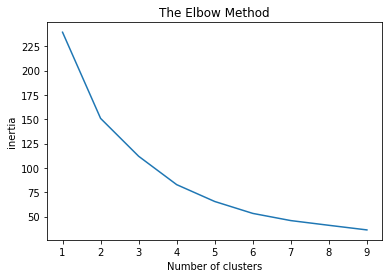

In [59]:
#Performing K means for new dataset with uncorrelated data

inertia = []
for i in range (1, 10):
  kmeans = KMeans(n_clusters=i, max_iter = 20, verbose = 1, random_state=42)
  kmeans.fit(covid_km1)
  inertia.append(kmeans.inertia_)
    
plt.plot(range(1,10), inertia)
plt.title('The Elbow Method')
plt.xlabel('Number of clusters')
plt.ylabel('inertia')
plt.show()
#sh

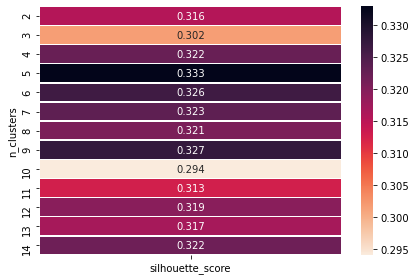

In [60]:
#Performance evaluation
#Silhouette Score
#The Silhouette Score and Silhouette Plot are used to measure the separation distance between clusters.

# Calculate Silhoutte Score
#
clusters_range = range (2,15)
results = []
for i in clusters_range:
  cluster = KMeans(n_clusters=i, init='k-means++', random_state=42)
  cluster_labels= cluster.fit_predict(covid_km1)
  silhouette_avg =  silhouette_score(covid_km1, cluster_labels)
  results.append([i, silhouette_avg])
result =  pd.DataFrame(results, columns=['n_clusters','silhouette_score'])
pivot = pd.pivot_table(result,index='n_clusters', values='silhouette_score')
plt.figure()
sns.heatmap(pivot, annot=True, linewidths=.5, fmt='.3f', cmap=sns.cm.rocket_r)
plt.tight_layout()



<font color = blue> The resultant cluster with uncorrelated data doesn't improve the Cluster accuracy(0.316<0.444). So taking the first model with all features as the final one for retaining all informations.

In [68]:
# Fit the Final model

km_final = KMeans(n_clusters = 2, max_iter = 50, verbose = 1).fit(covid_km)
predictions=kmeans.predict(covid_km)

Initialization complete
Iteration 0, inertia 1027.138912397405
Iteration 1, inertia 694.9080748636089
Iteration 2, inertia 678.1376045535983
Iteration 3, inertia 676.6982656824036
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 1581.0305437875759
Iteration 1, inertia 795.2765886142132
Iteration 2, inertia 730.4444410849909
Iteration 3, inertia 707.0235195880911
Iteration 4, inertia 694.9080748636089
Iteration 5, inertia 678.1376045535983
Iteration 6, inertia 676.6982656824036
Converged at iteration 6: strict convergence.
Initialization complete
Iteration 0, inertia 1356.5922131653235
Iteration 1, inertia 696.6787022152075
Iteration 2, inertia 678.1376045535983
Iteration 3, inertia 676.6982656824036
Converged at iteration 3: strict convergence.
Initialization complete
Iteration 0, inertia 923.8321725788157
Iteration 1, inertia 701.3675713655077
Iteration 2, inertia 684.6692353965162
Iteration 3, inertia 678.1376045535983
Iteration 4, inertia 67

In [69]:
km_final.labels_

array([1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0])

In [70]:
#Allocating cluster name to each observations
covid_km['cluster']=km_final.labels_
#covid_km.head(10)


In [71]:
#Create 2 dataframes for 2 clusters
cluster0=covid_km.loc[covid_km['cluster']==0]
cluster1=covid_km.loc[covid_km['cluster']==1]

In [72]:
#High Survival Rate States
cluster0.describe()

,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_multiple_medical_conditions_weighted,cluster
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.0
mean,0.799438,5.132306,5.628210,28.434397,15.518094,3.892791,2.258187,6.490866,21.827105,0.0
std,0.069344,0.586707,0.926130,2.128113,1.375055,0.889243,0.332060,0.723698,1.926595,0.0
min,0.616305,3.734004,2.995579,22.610181,13.084536,1.423868,1.683023,4.712648,14.955190,0.0
25%,0.778523,4.849137,5.366860,28.271886,14.603129,3.442732,2.017260,6.179478,20.900847,0.0
50%,0.799318,5.223594,5.784136,28.853507,15.661333,4.131460,2.216847,6.539600,22.325228,0.0
75%,0.831199,5.530154,6.111479,29.584504,16.331481,4.450459,2.523176,6.850299,22.973096,0.0
max,1.045132,6.382801,7.472028,31.354886,18.316442,5.098796,3.187622,7.767607,24.172361,0.0


In [73]:
#Low Survival Rate States
cluster1.describe()

,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_multiple_medical_conditions_weighted,cluster
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.0
mean,0.881063,5.456833,7.390300,34.599188,14.508354,5.556180,2.737238,7.150192,26.009801,1.0
std,0.036939,0.423602,0.751559,2.629941,1.463903,0.990548,0.323294,0.588674,1.885340,0.0
min,0.817676,4.598632,6.092542,31.360042,11.911545,4.162910,2.334031,6.330151,23.625303,1.0
25%,0.856031,5.167915,7.050537,32.437154,13.509776,4.778258,2.569608,6.732186,24.797367,1.0
50%,0.875608,5.432575,7.241743,33.611530,14.975818,5.498849,2.731841,7.126506,25.606472,1.0
75%,0.903627,5.695599,7.587677,36.388871,15.280756,6.086232,2.806432,7.429063,26.982726,1.0
max,0.971626,6.232315,9.456312,39.868922,17.873480,8.256990,3.802827,8.515737,31.499039,1.0


In [74]:
#examining cluster1
#cluster1

###  <font color = blue> Summary 

<font color = blue> K-Means clustering algorithm requires pre-determination of number of clusters i.e., 'k'. So to find optimal value of 'k', two measures, Silhouette Score and Elbow-Curve are used. 
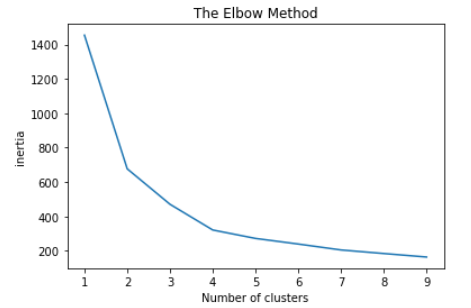    

The first elbow is at 2, also the silhouette score is high for k=2(0.444). So we can take k=2 and fit the model.

Eventhogh the clusters formed showing good measures the parameters used here have multicollinearuty. So I have removed the coreelated features and ran the k-means with 5 parameters only. But the result was not satisfying and even the Silhouette Score was less compared to the previous model. So I decided to take the previous model.
    
    
Now the states have been divided into 2 clusters. Cluster 0 has 32 provinces and cluster1 has 20 provinces. After comparing 0 to 1 cluster, it’s understood that cluster 0 has provinces with less percentage of people with medical history and cluster 1 has provinces with high percentage of people with medical history compared to cluster 0. The provinces California, Hawai, Texas with low CFR included in the cluster0 whereas countries like Western Virginia, Alabama, Mississippi with high CFR are included in cluster0.  So, we can say Kmeans algorithms has done a good job clustering the provinces and we can name the clusters into High survival rate provinces and low survival rate provinces. 




## <font color = blue> Heirarchial Agglomerative Cluster Analysis

In [75]:
covid_agg=covid_final.iloc[:, 1:10]
#covid_agg.info()

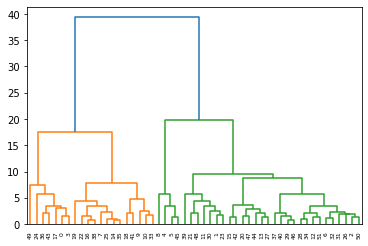

In [76]:
#dendogram
dendrogram = sch.dendrogram(sch.linkage(covid_agg, method='ward'))

In [77]:
#Fit the model with 2 clusters
model = AgglomerativeClustering(n_clusters=2, affinity='euclidean', linkage='ward')
model.fit(covid_agg)
labels = model.labels_
labels

array([1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 1, 1, 0, 0,
       1, 0, 1, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0], dtype=int64)

In [78]:
# silhouette_score
score1 = silhouette_score(covid_agg, labels, metric='euclidean')
score1

0.4441841833600198

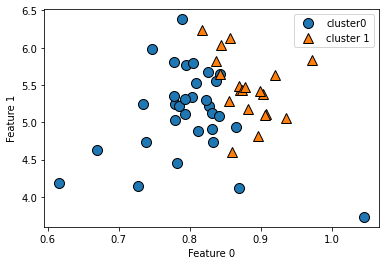

In [79]:
#Visualizing the clusters
assignment = model.fit_predict(covid_agg)
covid_agg = np.array(covid_agg)
mglearn.discrete_scatter(covid_agg[:,0], covid_agg[:,1], assignment)
plt.legend(['cluster0', 'cluster 1'], loc = 'best')
plt.xlabel('Feature 0')
plt.ylabel('Feature 1')
plt.show()

In [81]:
#Assigning cluster lables to the observations
covid_agg=covid_final.iloc[:, 1:10]
covid_agg['cluster']=labels
#covid_agg.head(10)


In [82]:
#Create 2 dataframes for 2 clusters
cluster_agg0=covid_agg.loc[covid_agg['cluster']==0]
cluster_agg1=covid_agg.loc[covid_agg['cluster']==1]

In [84]:
 #Summary statistics for cluster 0
cluster_agg0.describe()

,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_multiple_medical_conditions_weighted,cluster
count,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.000000,32.0
mean,0.799438,5.132306,5.628210,28.434397,15.518094,3.892791,2.258187,6.490866,21.827105,0.0
std,0.069344,0.586707,0.926130,2.128113,1.375055,0.889243,0.332060,0.723698,1.926595,0.0
min,0.616305,3.734004,2.995579,22.610181,13.084536,1.423868,1.683023,4.712648,14.955190,0.0
25%,0.778523,4.849137,5.366860,28.271886,14.603129,3.442732,2.017260,6.179478,20.900847,0.0
50%,0.799318,5.223594,5.784136,28.853507,15.661333,4.131460,2.216847,6.539600,22.325228,0.0
75%,0.831199,5.530154,6.111479,29.584504,16.331481,4.450459,2.523176,6.850299,22.973096,0.0
max,1.045132,6.382801,7.472028,31.354886,18.316442,5.098796,3.187622,7.767607,24.172361,0.0


In [85]:
#Summary statistics for cluster 1
cluster_agg1.describe()

,smoothed_pct_diabetes_weighted,smoothed_pct_cancer_weighted,smoothed_pct_heart_disease_weighted,smoothed_pct_high_blood_pressure_weighted,smoothed_pct_asthma_weighted,smoothed_pct_chronic_lung_disease_weighted,smoothed_pct_kidney_disease_weighted,smoothed_pct_autoimmune_disorder_weighted,smoothed_pct_multiple_medical_conditions_weighted,cluster
count,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.000000,20.0
mean,0.881063,5.456833,7.390300,34.599188,14.508354,5.556180,2.737238,7.150192,26.009801,1.0
std,0.036939,0.423602,0.751559,2.629941,1.463903,0.990548,0.323294,0.588674,1.885340,0.0
min,0.817676,4.598632,6.092542,31.360042,11.911545,4.162910,2.334031,6.330151,23.625303,1.0
25%,0.856031,5.167915,7.050537,32.437154,13.509776,4.778258,2.569608,6.732186,24.797367,1.0
50%,0.875608,5.432575,7.241743,33.611530,14.975818,5.498849,2.731841,7.126506,25.606472,1.0
75%,0.903627,5.695599,7.587677,36.388871,15.280756,6.086232,2.806432,7.429063,26.982726,1.0
max,0.971626,6.232315,9.456312,39.868922,17.873480,8.256990,3.802827,8.515737,31.499039,1.0


### <font color = blue> Summary

<font color = blue>  Agglomerative cluster analysis was performed on the data to determine if the states could be clustered into groups with similar characteristics. Python library used here is sklearn-AgglomerativeClustering.
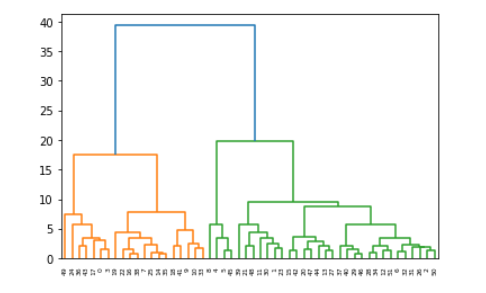
    
Looking at the dendrogram, the highest vertical distance that doesn’t intersect with any clusters is the blue one. Given that 2 vertical lines cross the threshold, the optimal number of clusters is 2.
We create an instance of AgglomerativeClustering using the euclidean distance as the measure of distance between points and ward linkage to calculate the proximity of clusters.The labels_ property returns an array of integers where the values correspond to the distinct categories. the silhouette score is 0.444, which shows a good cluster model. 

By examining the resultant clusters, we can see that they are very similar to the clusters created by K-means. 


### <font color = blue> Final Cluster Model

<font color = blue> As we can see in the preceding section, the results of both clustering are nearly identical to the same dataset. However, while there are many similarities between these two techniques, there are also some differences. With the kmeans model you would only need to make a predict over the vector of characteristics of this new province to obtain the cluster this province belongs to, whereas with agglomerative you will have to retrain the algorithm with the whole data including this new observation. So by taking the simplicity of interpretation and implementation I have selected K-means cluster model as thefinal mode. 

## <font color = blue>Task 3


### <font color = blue> Supervised Learning


#### <font color = blue> Binning


<font color = blue> Binning will transform a column of continuous numbers and sort them into "bins" based on the ranges we specify. I have used pandas cut functions to create bins. Intervals have been calculated using taking minimum and maximum values in the field Case_Fatality_Rate. Now there is one more column bins in your data frame which contains a high survival rate and low survival rate(low CFR indicates high survival rate and vice versa). Label 0 indicates a high survival rate and label 1 indicates a low survival rate. 


In [87]:
#binning
#1.79 is the avg CFR of US according to world data

In [88]:
covid_super=covid_final.copy()
#covid_super.head()

In [89]:
#Calculating boundaries for bins
min_cfr=covid_super['Case_Fatality_Rate'].min()
max_cfr=covid_super['Case_Fatality_Rate'].max()
min_cfr
max_cfr

2.7

In [90]:
#evenly splitting the data
bins=np.linspace(min_cfr,max_cfr,3)
bins

array([0.47 , 1.585, 2.7  ])

In [91]:
# creating labels for bins 0-low mortality 1 high mortality
labels=[0,1]

In [92]:
#Creating bins for 'Case_Fatality_Ratio'
covid_super['bins'] = pd.cut(covid_super['Case_Fatality_Rate'], bins=bins, labels=labels, include_lowest=True)

(array([22., 30.]),
 array([0.47 , 1.585, 2.7  ]),
 <BarContainer object of 2 artists>)

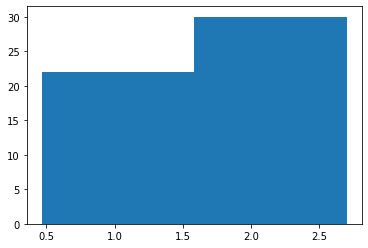

In [93]:
#histogram
plt.hist(covid_super['Case_Fatality_Rate'],bins=2)

In [94]:
#Creating predictor dataframe
covid_pred = covid_super.iloc[:, 1:10]
covid_pred.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52 entries, 0 to 51
Data columns (total 9 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   smoothed_pct_diabetes_weighted                     52 non-null     float64
 1   smoothed_pct_cancer_weighted                       52 non-null     float64
 2   smoothed_pct_heart_disease_weighted                52 non-null     float64
 3   smoothed_pct_high_blood_pressure_weighted          52 non-null     float64
 4   smoothed_pct_asthma_weighted                       52 non-null     float64
 5   smoothed_pct_chronic_lung_disease_weighted         52 non-null     float64
 6   smoothed_pct_kidney_disease_weighted               52 non-null     float64
 7   smoothed_pct_autoimmune_disorder_weighted          52 non-null     float64
 8   smoothed_pct_multiple_medical_conditions_weighted  52 non-null     float64
dtypes: float64(9)

In [95]:
#Creating target dataframe for classification
covid_targ = covid_super.loc[:,'bins']
#covid_targ

In [96]:
#Creating test and train data using the ratio 3:7
x_covid_train, x_covid_test, y_covid_train, y_covid_test = train_test_split(covid_pred, covid_targ, 
                                                                                    test_size = 0.3, random_state = 101)

### <font color = blue> Classification Algorithms

### <font color = blue> Logistic Regression

<font color = blue> Aim
    
Predict Case Fatality Rate(CFR) categories(high or low) based on health history


In [97]:
#Fit logistic regression on train data
logit = LogisticRegression(verbose = 1,max_iter=10000).fit(x_covid_train, y_covid_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished


In [98]:
#Predict 
logit_pred = logit.predict(x_covid_test)

In [99]:
#Calculating Confusion Matrix
confusion_matrix(y_covid_test, logit_pred)

array([[2, 3],
       [6, 5]], dtype=int64)

In [100]:
accuracy_score(y_covid_test, logit_pred)

0.4375

In [101]:
precision_score(y_covid_test, logit_pred)

0.625

In [102]:
recall_score(y_covid_test, logit_pred)

0.45454545454545453

In [103]:
f1_score(y_covid_test, logit_pred)

0.5263157894736842

In [104]:
logReg_MSE = mean_squared_error(y_covid_test, logit_pred)
logReg_MSE

0.5625

In [105]:
logReg_MAE= mean_absolute_error(y_covid_test, logit_pred)
logReg_MAE

0.5625

### <font color = blue> Summary

<font color = blue> The function LogisticRegression from sklearn.linaer_model is used to implement logistic regression.  The model was trained and a classification accuracy of 43.7% was obtained. It showed that Logistic Regression was not very suitable for this dataset. The confusion matrix also shows more false positives and negatives than true ones. Only 62.5% percent of the correctly predicted cases turned out to be positive cases and only 45.45% of the positives were successfully predicted by our model. This indicated our model is failed to classify properly.

In [106]:
### Decision trees

In [107]:
#Decision tree without optimization
tree_overfit = DecisionTreeClassifier(criterion = 'entropy', random_state = 123)

In [108]:
tree_overfit.fit(x_covid_train, y_covid_train)

DecisionTreeClassifier(criterion='entropy', random_state=123)

In [109]:
tree_overfit.score(x_covid_train, y_covid_train)

1.0

In [110]:
tree_overfit.score(x_covid_test, y_covid_test)

0.625

In [111]:
#Decisoion Tree with optimization using maximum depth = 4
tree_restricted = DecisionTreeClassifier(criterion = 'entropy', random_state = 123, max_depth = 4)

In [112]:
tree_restricted.fit(x_covid_train, y_covid_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=123)

In [113]:
tree_restricted.score(x_covid_train, y_covid_train)

0.9166666666666666

In [114]:
tree_restricted.score(x_covid_test, y_covid_test)

0.6875

<font color = blue> Optimized tree outperformed normal tree. So continuing with optimized tree.

In [115]:
#Feature importance
tree_restricted.feature_importances_

array([0.        , 0.1034857 , 0.1088596 , 0.14645287, 0.18084182,
       0.        , 0.12347255, 0.33688746, 0.        ])

In [116]:
#Creating new predictors dataset with high feature importance
x_covid_test_new=x_covid_test.drop(['smoothed_pct_diabetes_weighted','smoothed_pct_chronic_lung_disease_weighted','smoothed_pct_multiple_medical_conditions_weighted'],axis=1)
x_covid_train_new=x_covid_train.drop(['smoothed_pct_diabetes_weighted','smoothed_pct_chronic_lung_disease_weighted','smoothed_pct_multiple_medical_conditions_weighted'],axis=1)

In [117]:
#Fit new tree
tree_feature_imp=DecisionTreeClassifier(criterion = 'entropy', random_state = 123, max_depth = 4)
tree_feature_imp.fit(x_covid_train_new, y_covid_train)

DecisionTreeClassifier(criterion='entropy', max_depth=4, random_state=123)

In [118]:
tree_feature_imp.score(x_covid_train_new, y_covid_train)

0.9166666666666666

In [119]:
tree_feature_imp.score(x_covid_test_new, y_covid_test)

0.6875

<font color = blue> model with high feature importance performs same as the optimized tree. So taking the optimized one with all features as the final model.

In [120]:
#Final model
tree_pred=tree_restricted.predict(x_covid_test)

In [121]:
confusion_matrix(y_covid_test, tree_pred)

array([[3, 2],
       [3, 8]], dtype=int64)

In [122]:
accuracy_score(y_covid_test, tree_pred)

0.6875

In [123]:
precision_score(y_covid_test, tree_pred)

0.8

In [124]:
recall_score(y_covid_test, tree_pred)

0.7272727272727273

In [125]:
f1_score(y_covid_test, tree_pred)

0.761904761904762

In [126]:
tree_MSE = mean_squared_error(y_covid_test, tree_pred)
tree_MSE

0.3125

In [127]:
tree_MAE= mean_absolute_error(y_covid_test, tree_pred)
tree_MAE

0.3125

### <font color = blue> Summary

<font color = blue> A decision tree classifier is used to predict the survival category based on medical history. The python library used here is sklearn. DecisionTreeClassifier. The model is trained and a classification accuracy of 68.75% is obtained. Feature importances are provided by the fitted attribute feature_importances_ . A new model is trained by removing the least important features smoothed_pct_diabetes_weighted','smoothed_pct_chronic_lung_disease_weighted','smoothed_pct_multiple_medical_conditions_weighted' and no improvement can be found out in the accuracy. So the earlier model is selected as the final one. 


Confusion matrix
•	True Positive (TP) = 3; meaning 3 positive class data points were correctly classified by the model
•	True Negative (TN) = 8; meaning 8 negative class data points were correctly classified by the model
•	False Positive (FP) = 2; meaning 2 negative class data points were incorrectly classified as belonging to the positive class by the model
•	False Negative (FN) = 3; meaning 3
This turned out to be a decent classifier for our dataset considering the relatively larger number of true positive and true negative values. 

80% percent of the correctly predicted cases turned out to be positive cases. Whereas 72.7% of the positives were successfully predicted by our model. 
F1-score of 0.76 also indicates a good model. All these indicated our model is fsuccessful to classify properly.


### Random Forest

In [128]:
rf = RandomForestClassifier(random_state = 198, verbose = 1, )

In [129]:
rf.fit(x_covid_train, y_covid_train)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


RandomForestClassifier(random_state=198, verbose=1)

In [132]:
rf.score(x_covid_train, y_covid_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


1.0

In [133]:
rf.score(x_covid_test, y_covid_test)


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


0.5625

In [134]:
rf_opt = RandomForestClassifier(random_state = 198, verbose = 1, max_depth=4 )

In [135]:
rf_opt.fit(x_covid_train, y_covid_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


RandomForestClassifier(max_depth=4, random_state=198, verbose=1)

In [136]:
rf_opt.score(x_covid_train, y_covid_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


0.9722222222222222

In [137]:
rf_opt.score(x_covid_test, y_covid_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


0.5625

<font color = blue > The optimized tree also providing the same scores, but for better performance I am taking the optimized model

In [141]:
rf_opt.feature_importances_

array([0.083668  , 0.06844196, 0.08498304, 0.0979612 , 0.19270051,
       0.08358091, 0.1001841 , 0.21634847, 0.07213181])

In [142]:
#tree without smoothed_pct_cancer_weighted

x_covid_test_new=x_covid_test.drop('smoothed_pct_cancer_weighted',axis=1)
x_covid_train_new=x_covid_train.drop('smoothed_pct_cancer_weighted',axis=1)

In [143]:
rf_feature = RandomForestClassifier(random_state = 198, verbose = 1, max_depth=4 )
rf_feature.fit(x_covid_train_new, y_covid_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.1s finished


RandomForestClassifier(max_depth=4, random_state=198, verbose=1)

In [144]:
rf_feature.score(x_covid_train_new, y_covid_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


1.0

In [145]:
rf_feature.score(x_covid_test_new, y_covid_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


0.5625

<font color = blue > The optimized tree with selected features also providing the same scores, so continuing with optimized model

In [146]:
#Final model
rf_pred=rf_opt.predict(x_covid_test)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done 100 out of 100 | elapsed:    0.0s finished


In [147]:
accuracy_score(y_covid_test, rf_pred)

0.5625

In [148]:
confusion_matrix(y_covid_test, rf_pred)

array([[3, 2],
       [5, 6]], dtype=int64)

In [149]:
precision_score(y_covid_test, rf_pred)

0.75

In [150]:
recall_score(y_covid_test, rf_pred)

0.5454545454545454

In [151]:
f1_score(y_covid_test, rf_pred)

0.631578947368421

In [152]:
rf_MSE = mean_squared_error(y_covid_test, rf_pred)
rf_MSE

0.4375

In [153]:
rf_MAE= mean_absolute_error(y_covid_test, rf_pred)
rf_MAE

0.4375

<font color = blue> The random forest is a model made up of many decision trees. A random forest classifier is used to predict the survival category based on medical history. 
    
The python library used here is sklearn. RandomForestClassifier. The model is trained and a classification accuracy of 56.25% is obtained. Feature importances are provided by the fitted attribute feature_importances_ and they are computed as the mean and standard deviation of accumulation of the impurity decrease within each tree. 

An optimized model is trained with maximum depth=4 and showed the same performance as previous one. Selected the optimized one for better performance. 
    
A new model is trained by removing the least important features ‘smoothed_pct_cancer_weighted', and no improvement can be found out in the accuracy. So the earlier model is selected as the final one. 
    
The confusion matrix also shows more false negatives  than true negatives. 75% percent of the correctly predicted cases turned out to be positive cases wheras only 54.5% of the negatives were predicted by our model. This indicated our model is better than logistic regression.


### <font color = blue> Regression Algorithms

<font color = blue> Aim:
To predict continuous variable ‘Case_Fatality_Rate’


### <font color = blue> CART

In [154]:
# CART (classification and regression tree) :
# for classification :
model_gini = DecisionTreeClassifier(criterion='gini', max_depth=3)
model_gini.fit(x_covid_train, y_covid_train)
gini_pred = model_gini.predict(x_covid_test)
pd.Series(gini_pred).value_counts()
np.mean(y_covid_test==gini_pred)    

0.6875

In [155]:
covid_targ = covid_super.loc[:,'Case_Fatality_Rate']
#covid_targ

In [156]:
# DecisionTree for Regression :
#array = iris.values

# here we cant take categorical columns (species) so we try to predict petal_width :

x_new_train, x_new_test, y_new_train, y_new_test = train_test_split(covid_pred, covid_targ, test_size=0.3, random_state=40)
# x_new_train.shape     

In [157]:
# make model for regression and fit :
reg_model = DecisionTreeRegressor()
reg_model.fit(x_new_train, y_new_train)
reg_model.score(x_new_test, y_new_test)            
 

-0.5387093296808512

In [160]:
#Model with uncorrelated predictors
covid_pred1=covid_super.iloc[:, [1,2,3,5,7,8]]
x_train, x_test, y_train, y_test = train_test_split(covid_pred1, covid_targ, test_size=0.3, random_state=40)

In [161]:
reg_model1 = DecisionTreeRegressor()
reg_model1.fit(x_train, y_train)
reg_model1.score(x_test, y_test)            
 

-0.9700065313472959

In [158]:
reg_pred = reg_model.predict(x_new_test)
pd.crosstab(reg_pred, y_new_test)
np.mean(reg_pred==y_new_test)

0.0

In [165]:
cart_MSE = mean_squared_error(y_new_test, reg_pred)
cart_MSE

0.37433125

In [166]:
cart_MAE= mean_absolute_error(y_new_test, reg_pred)
cart_MAE

0.431875

In [167]:
metrics.r2_score(y_new_test, reg_pred)

-1.0255377792996447

<font color = blue> Classification and regression Tree algorithm is used to predict CFR. Two models were trained one with all predictors and another with uncorrelated predictors. CART is not able to predict the values and the model is a failure.

### <font color = blue> Linear Regression

In [169]:
linReg = LinearRegression().fit(x_new_train, y_new_train)

In [170]:
linReg.coef_

array([-2.25453308,  0.18912616, -0.509081  , -0.01127382, -0.00798503,
        0.08823214, -0.49178051, -0.78549381,  0.40813789])

In [171]:
linReg.intercept_

2.7841534851240475

In [172]:
prediction = linReg.predict(x_new_test)

In [173]:
metrics.r2_score(y_new_test, prediction)

-0.8231323867830667

In [174]:
linReg_MSE = mean_squared_error(y_new_test, prediction)
linReg_MSE

0.3369255474938396

In [175]:
linReg_MAE= mean_absolute_error(y_new_test, prediction)
linReg_MAE

0.434388620860681

In [163]:
#Model with uncorrelated predictors
linReg1 = LinearRegression().fit(x_train, y_train)
prediction1 = linReg1.predict(x_test)
metrics.r2_score(y_test, prediction1)

-0.33563427275822777

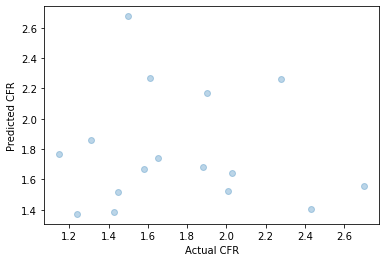

In [176]:
plt.scatter(x = y_new_test, y = prediction, alpha = 0.3)
plt.title = ('Linear Regression - Actual vs Predicted')
plt.xlabel('Actual CFR')
plt.ylabel('Predicted CFR')
plt.show()

<font color = blue> The class LinearRegression from sklearn.linear_model is used to fit linear regression on the covid dataset. Two models were trained one with all predictors and another with uncorrelated predictors.  A mean absolute error of 0.434 is an indication of good model since our actual data ranges from 0 to 3. But having -0.82 R2-Square value doesn’t indicate a good model. This indicated the best fit line is not able to fit all the data inside the line indicating a worse fit.
    
As indicated int Task 1 there is no correlation between predictors and target variable. This might be a reason the regression models are not a good fit. Whereas by binning the continous variable to categorical variable the chances of getting predicted is increased. This moght be the reason for good performance of Classification Algorithms

#### <font color = blue> Final Model

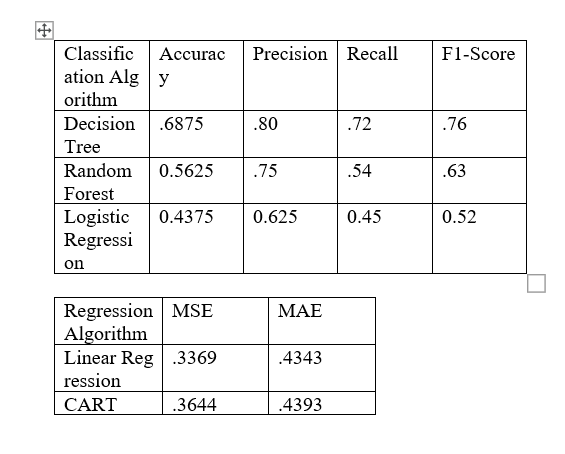

<font color = blue>

By comparing different classification and regression algorithms on our dataset it is proved that classification algorithms work better for our datasets. Whilst comparing the classification algorithms Decision Tree algorithm shows higher metrics in all cases compared to the other two. So the final model is the Decision Tree Classifier with 9 features and a maximum depth of 4.

## <font color = blue> Conclusion

<font color = blue> In conclusion three different datasets related to Covid-19 symptoms, cases, and deaths are combined and analysed to make models suitable for predicting survival rate from Covid-19. Nine features related to the medical conditions of patients are extracted for analysis. Out of the two clustering algorithms performed, K-means clustering algorithms is selected as the final model and classified the provinces in US to two clusters namely Low-Survival-Rate-States and High-Survival-Rate-States.
These categories can be useful in developing various policies in the health sector; additionally, this information can assist physicians and economic experts. The provinces that are members of the same clusters can provide similar assistance in taking preventive measures to avoid worst-case scenarios. 
The data is trained and modelled with five supervised learning algorithms and predicted Case_Fatality_Rate. To apply classification algorithms the Case_Fatality_Field is binned into two categories. Linear regression and CART are used to implement regression but that found to be a failure. Whereas all the three classification algorithms(Logistic, Decision Trees and Random Forest) are showing promising results. Whilst comparing the performance metrics Decision Tree algorithms is selected as the  best model for prediction.

In the future, this research could be expanded with more attributes to increase the number of variables, such as the overall population, age distribution, gender, ethnicity and climate, to see how the cluster formation and and the prediction score varies . Also I have planned to check the reliability of model by comparing the actual data and survey data.


## <font color = blue> Appendix

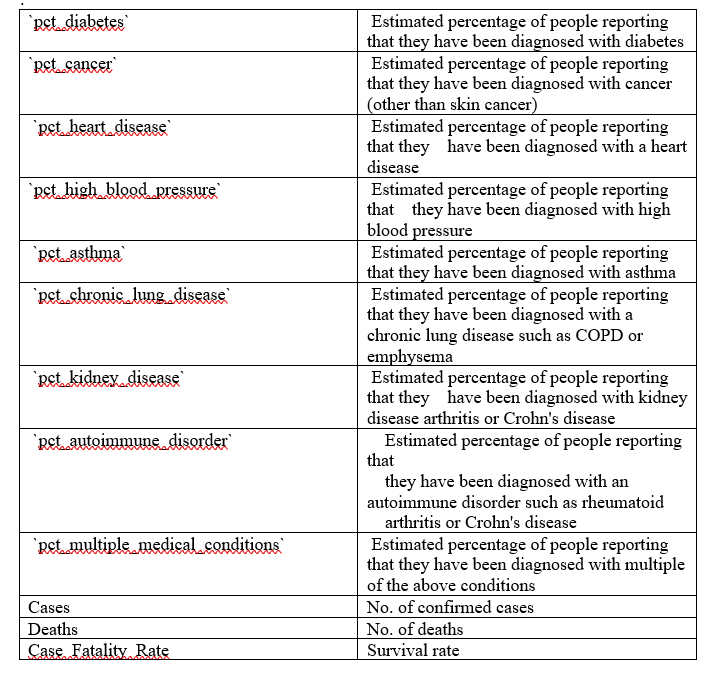
Data set description